#  Team IXDSangam Cosmic Classifier Notebook

Import dependencies and load the csv file

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df = pd.read_csv('/content/thermoracleTrain.csv')


Map the prediction labels to their implied meanings

In [ ]:
prediction_map = {
    0: "Habitable",
    1: "Terraformable",
    2: "Resource-rich",
    3: "Scientific",
    4: "Gas giant",
    5: "Desert planet",
    6: "Ice world",
    7: "Toxic atmosphere",
    8: "High radiation",
    9: "Dead world"
}

df["Prediction"] = df["Prediction"].map(prediction_map)

df

<ipython-input-31-e9a251d0175e>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Prediction"] = df["Prediction"].map(prediction_map)


,Atmospheric Density,Surface Temperature,Gravity,Water Content,Mineral Abundance,Orbital Period,Proximity to Star,Magnetic Field Strength,Radiation Levels,Atmospheric Composition Index,Prediction
0,0.472806,NaN,-0.313872,-2.089299,-0.152201,-0.885649,0.900105,NaN,Category_6,0.692907,Desert planet
1,4.180154,-1.157515,2.430956,-1.595850,-3.188678,-0.609434,-0.199828,Category_9,Category_9,NaN,Habitable
2,-0.129008,1.621592,-0.785741,2.081196,-1.413796,-0.095152,-3.502577,NaN,Category_8,-0.677182,Gas giant
3,-3.122000,-2.299818,1.072092,0.353524,-0.192529,2.917067,-1.972329,NaN,Category_11,0.109429,Terraformable
4,-1.459426,2.890268,0.148757,-0.804439,0.494875,0.044910,-0.438796,Category_6,Category_10,0.407941,Dead world
...,...,...,...,...,...,...,...,...,...,...,...
59995,-0.316003,-1.160519,0.544548,-1.407123,1.427861,0.849849,-1.932329,Category_8,Category_5,1.333760,High radiation
59996,0.789506,-2.645345,-0.375569,-2.579966,0.783195,0.671547,-2.041189,Category_14,Category_4,0.170505,Scientific
59997,-0.662563,0.642230,-1.175106,-2.783240,-0.902704,-1.694373,-1.824274,Category_8,Category_8,1.010311,Desert planet
59998,0.475118,-0.021458,2.086274,1.444825,-1.986595,-2.113147,-0.348915,Category_11,Category_9,-0.665345,Ice world


## Initial Exploratory Data Analysis

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


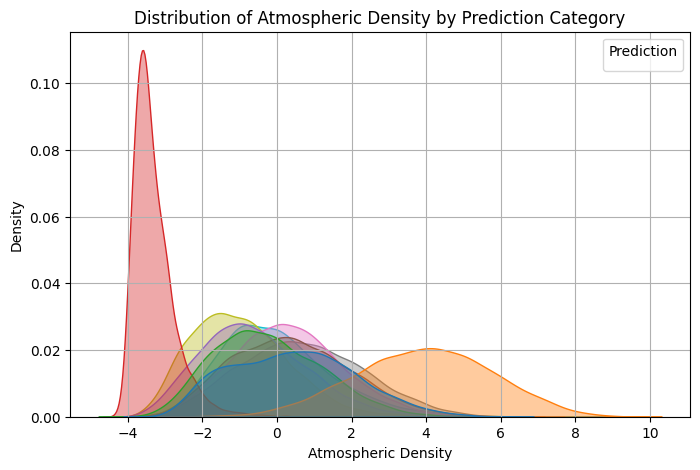

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


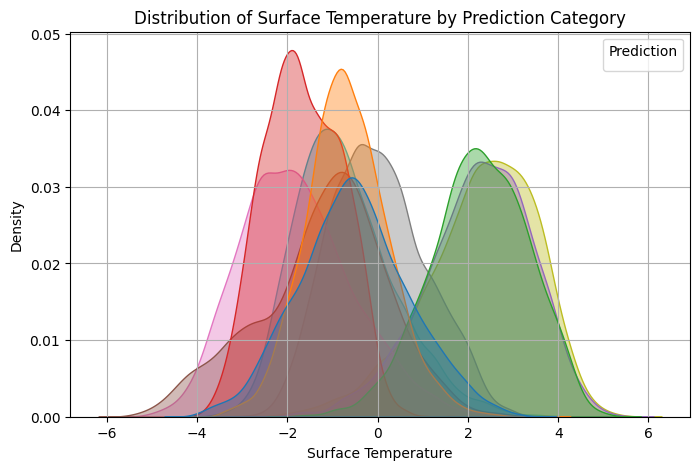

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


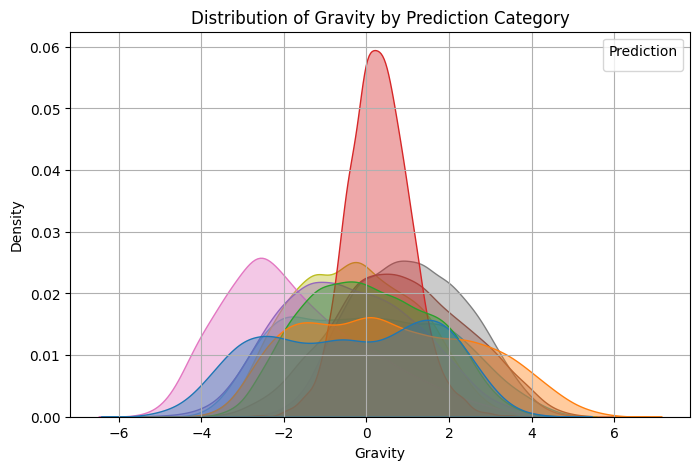

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


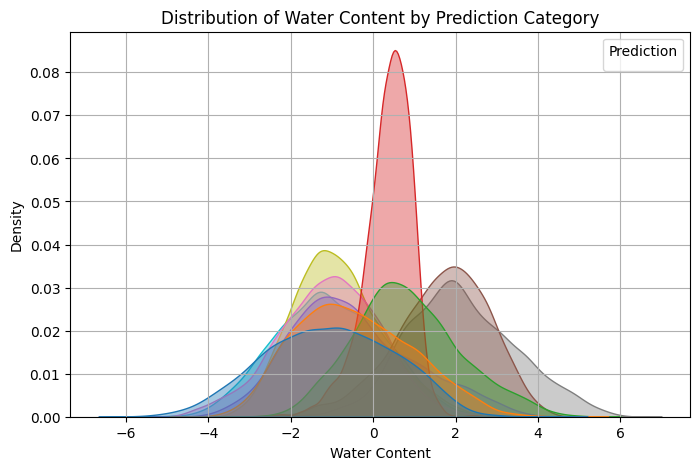

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


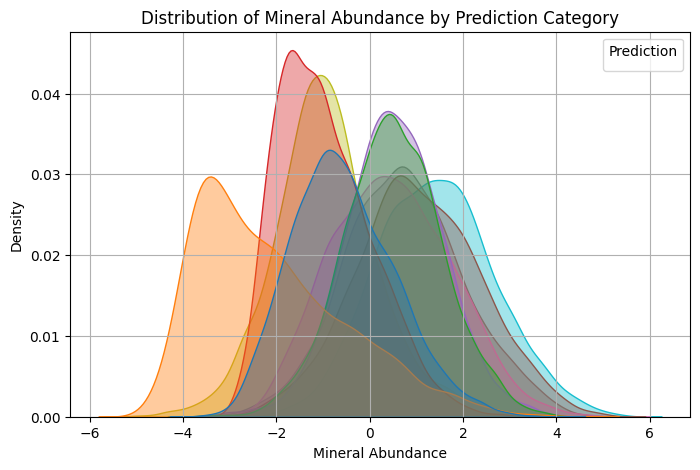

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


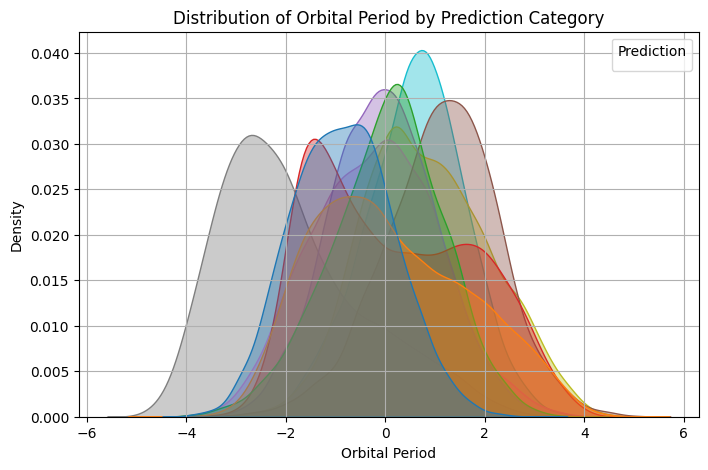

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


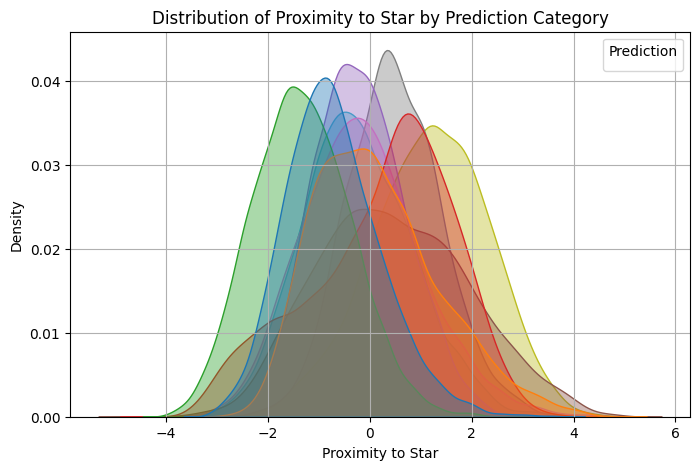

<ipython-input-4-09150b991e63>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Prediction")


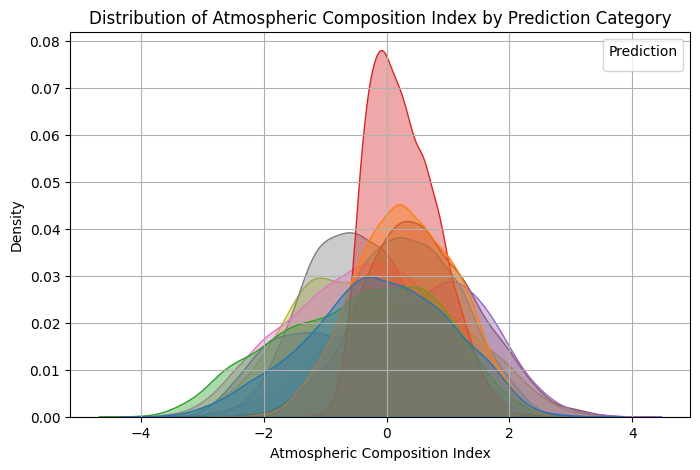

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

features = [
    "Atmospheric Density", "Surface Temperature", "Gravity",
    "Water Content", "Mineral Abundance", "Orbital Period",
    "Proximity to Star", "Atmospheric Composition Index"
]

for feature in features:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=df, x=feature, hue="Prediction", fill=True, alpha=0.4)
    plt.title(f"Distribution of {feature} by Prediction Category")
    plt.xlabel(feature)
    plt.ylabel("Density")
    plt.legend(title="Prediction")
    plt.grid(True)
    plt.show()

## Analyze which label depends on which features the most

Please upload your CSV file.


Saving thermoracleTrain.csv to thermoracleTrain.csv


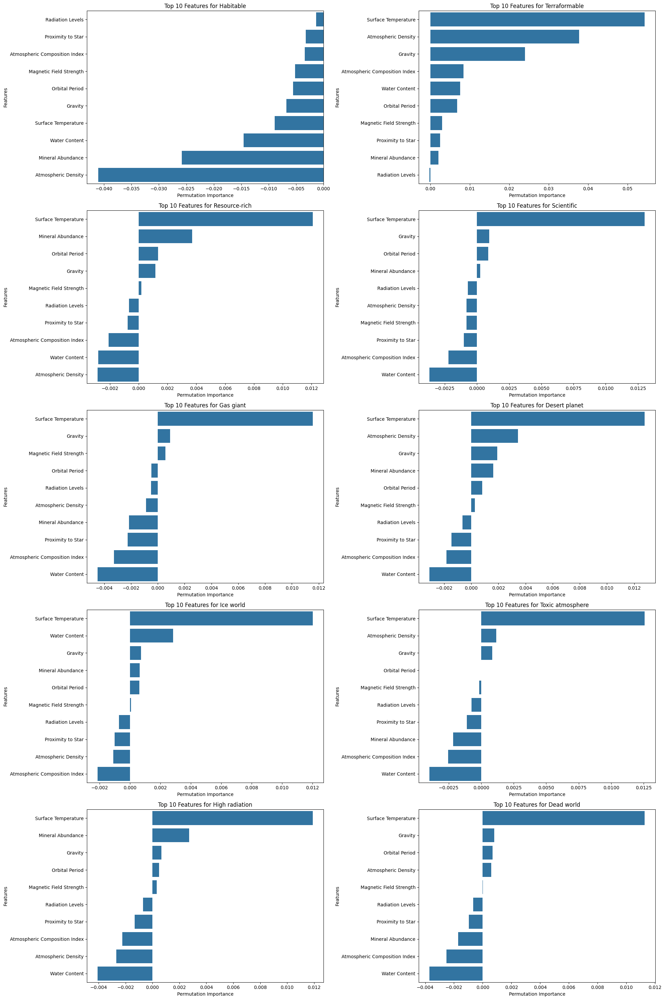


Top 10 Features for Habitable:
                         feature  importance
8               Radiation Levels   -0.001369
6              Proximity to Star   -0.003256
9  Atmospheric Composition Index   -0.003423
7        Magnetic Field Strength   -0.005206
5                 Orbital Period   -0.005579
2                        Gravity   -0.006748
1            Surface Temperature   -0.008873
3                  Water Content   -0.014575
4              Mineral Abundance   -0.025844
0            Atmospheric Density   -0.041050

Top 10 Features for Terraformable:


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
import time
import logging

# Configure logging
logging.basicConfig(level=logging.INFO,
                    format='%(asctime)s - %(levelname)s: %(message)s',
                    datefmt='%Y-%m-%d %H:%M:%S')
logger = logging.getLogger(__name__)

# Upload data function for Colab
def upload_data():
    from google.colab import files
    uploaded = files.upload()
    for name, data in uploaded.items():
        with open(name, 'wb') as f:
            f.write(data)
    return list(uploaded.keys())[0]

# Main analysis function
def analyze_planetary_data(filename):
    # Start timing
    start_time = time.time()
    logger.info("Starting data analysis...")

    # Load data
    data = pd.read_csv(filename)

    # Define class labels
    class_labels = {
        0: "Habitable", 1: "Terraformable", 2: "Resource-rich",
        3: "Scientific", 4: "Gas giant", 5: "Desert planet",
        6: "Ice world", 7: "Toxic atmosphere",
        8: "High radiation", 9: "Dead world"
    }

    # Preprocessing
    logger.info("Preprocessing data...")

    # Identify column types
    numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
    categorical_columns = data.select_dtypes(include=['object']).columns

    # Handle Missing Values
    numeric_imputer = SimpleImputer(strategy='median')
    data[numeric_columns] = numeric_imputer.fit_transform(data[numeric_columns])

    categorical_imputer = SimpleImputer(strategy='most_frequent')
    data[categorical_columns] = categorical_imputer.fit_transform(data[categorical_columns])

    # Encode categorical columns
    label_encoders = {}
    for col in categorical_columns:
        le = LabelEncoder()
        data[col] = le.fit_transform(data[col].astype(str))
        label_encoders[col] = le

    # Prepare data for modeling
    X = data.drop('Prediction', axis=1)
    y = data['Prediction']

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Scale the features
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)

    # Train Random Forest Classifier
    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier.fit(X_train_scaled, y_train)

    # Function to get feature importance for a specific class
    def get_class_feature_importance(classifier, X, y, class_label):
        # Create binary classification for the specific class
        y_binary = (y == class_label).astype(int)

        # Perform permutation importance
        perm_importance = permutation_importance(classifier, X, y_binary, n_repeats=10, random_state=42)

        # Create a DataFrame of feature importances
        importance_df = pd.DataFrame({
            'feature': X.columns,
            'importance': perm_importance.importances_mean
        }).sort_values('importance', ascending=False)

        return importance_df

    # Visualize feature importance for each class
    plt.figure(figsize=(20, 30))
    for i, (label_num, label_name) in enumerate(class_labels.items(), 1):
        plt.subplot(5, 2, i)

        # Get feature importance for this class
        class_importance = get_class_feature_importance(rf_classifier, X_train_scaled, y_train, label_num)

        # Plot top 10 features
        top_10_features = class_importance.head(10)
        sns.barplot(x='importance', y='feature', data=top_10_features)
        plt.title(f'Top 10 Features for {label_name}')
        plt.xlabel('Permutation Importance')
        plt.ylabel('Features')
        plt.tight_layout()

    plt.show()

    # Print detailed feature importance for each class
    for label_num, label_name in class_labels.items():
        print(f"\nTop 10 Features for {label_name}:")
        class_importance = get_class_feature_importance(rf_classifier, X_train_scaled, y_train, label_num)
        print(class_importance.head(10))

    # Log total execution time
    logger.info(f"Analysis completed in {time.time() - start_time:.2f} seconds")

# Colab execution
def main():
    print("Please upload your CSV file.")
    filename = upload_data()
    analyze_planetary_data(filename)

# Run the main function
main()

In [ ]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 58.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=7af54445651fa0f646495024502ad2db55f2268c029b8d131ce3eef344ab8449
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


## Secondary exploratory data analysis

Using the ydata_profiling library, we generate an in-depth profiling report of the data. This report summarizes distributions, correlations, and potential issues, aiding in the initial exploratory data analysis.

In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(train_df, title="Planets Dataset Profiling Report")
profile.to_notebook_iframe()

profile.to_file("planets_dataset_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df = df.dropna(subset=['Prediction'])


# Path A: Fill null values with mean

In [ ]:
features = ['Atmospheric Density',	'Surface Temperature',	'Gravity',	'Water Content',	'Mineral Abundance',	'Orbital Period',	'Proximity to Star','Atmospheric Composition Index']

for feature in features:
    df[feature] = df[feature].fillna(df.groupby('Prediction')[feature].transform('mean'))


Encode categorical variables

In [ ]:
from sklearn.preprocessing import LabelEncoder

categorical_features = ['Magnetic Field Strength', 'Radiation Levels']

label_encoders = {}
for feature in categorical_features:
    le = LabelEncoder()
    df[feature] = le.fit_transform(df[feature].astype(str))
    label_encoders[feature] = le

for feature in categorical_features:
    mode_per_label = df.groupby('Prediction')[feature].agg(lambda x: x.mode()[0] if not x.mode().empty else None)
    df[feature] = df.apply(lambda row: mode_per_label[row['Prediction']] if pd.isna(row[feature]) else row[feature], axis=1)


Split the training dataset for validation and testing

In [ ]:
from sklearn.model_selection import train_test_split

X = df.drop(columns=['Prediction'])  # Features
y = df['Prediction']  # Target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


## Approach 1 - Neural Networks (3 hidden layers - 256, 128, 64)

**ExoMiner Neural Network for Exoplanet Classification**


Key Features:
*   Multiple Dense Layers: Captures complex nonlinear relationships in the input features

*   Batch Normalization: Stabilizes learning and speeds up convergence.


*   
Dropout: Reduces overfitting by randomly deactivating neurons during training.











In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras import Input
import numpy as np

gpu_devices = tf.config.list_physical_devices('GPU')
print("GPU available:", gpu_devices)

# Define the ExoMiner-inspired model architecture
def create_exominer_model(input_dim, num_classes):
    inputs = Input(shape=(input_dim,), name="planet_features")

    # First dense block
    x = Dense(256, activation='relu')(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Second dense block
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Third dense block
    x = Dense(64, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Output layer with softmax activation for multi-class classification
    outputs = Dense(num_classes, activation='softmax')(x)

    # Create the model
    model = Model(inputs=inputs, outputs=outputs, name="ExoMiner")
    return model

input_dim = 10
num_classes = 10

# Create and compile the model using sparse categorical crossentropy
model = create_exominer_model(input_dim, num_classes)

model.summary()

GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


Model: "ExoMiner"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ planet_features (InputLayer)         │ (None, 10)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 256)                 │           2,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 46,410 (181.29 KB)

 Trainable params: 45,514 (177.79 KB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.00001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit(X_train, y_train, epochs=40, batch_size=32)

Epoch 1/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8932 - loss: 0.3276
Epoch 2/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8948 - loss: 0.3228
Epoch 3/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8946 - loss: 0.3179
Epoch 4/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8945 - loss: 0.3174
Epoch 5/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8899 - loss: 0.3291
Epoch 6/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - accuracy: 0.8966 - loss: 0.3244
Epoch 7/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8943 - loss: 0.3213
Epoch 8/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8947 - loss: 0.3211
Epoch 9/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8928 - loss: 0.3276
Epoch 10/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8968 - loss: 0.3148
Epoch 11/40
1424/1424 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8941 - loss: 0.3223
Epoch 12/40
1424/1424 ━━━━━━

In [ ]:
!pip install cupy-cuda12x


## Approach 2 -  Support Vector Machines

SVM is like a razor-sharp blade slicing through data, finding the optimal hyperplane to separate classes. But tuning its hyperparameters unlocks its true power:






*   C (Regularization): Controls how strictly the model fits the data—low C allows flexibility, high C enforces precision.

*   Kernel Choice: Transforms the way SVM sees the data (linear, RBF, polynomial) to capture complex patterns.
*   Gamma: Determines how far each point’s influence extends—low gamma smooths decisions, high gamma sharpens boundaries.




With RandomizedSearchCV, we systematically fine-tune these parameters, ensuring the SVM generalizes well. This transforms it from a standard classifier into an elite decision-making machine, extracting hidden patterns with unmatched precision.

In [ ]:
import cupy as cp
import numpy as np
import pandas as pd
import logging
from tqdm import tqdm
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import accuracy_score, classification_report

logging.basicConfig(
    format="%(asctime)s - %(levelname)s - %(message)s",
    level=logging.INFO
)

X = df.drop(columns=['Prediction'])
y = df['Prediction']

logging.info("Converting data to GPU arrays...")
X = cp.asarray(X.to_numpy())
y = cp.asarray(y.to_numpy())

logging.info("Splitting dataset into train and test sets...")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_dist = {
    'C': np.logspace(-2, 2, 10),
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto']
}

# SVM Model
svm_model = SVC()

# Number of iterations
n_iter_search = 3

# Randomized Search with Logging
random_search = RandomizedSearchCV(
    estimator=svm_model,
    param_distributions=param_dist,
    n_iter=n_iter_search,
    cv=3,
    scoring='accuracy',
    n_jobs=-1,   # Runs in parallel
    verbose=2,   # Logs progress
    random_state=42
)

logging.info("Starting hyperparameter tuning...")
random_search.fit(X_train.get(), y_train.get())  # Removed callback to fix pickling error

# Get best parameters
logging.info(f"Best Parameters: {random_search.best_params_}")

# Make predictions
logging.info("Making predictions...")
y_pred = random_search.best_estimator_.predict(X_test.get())

# Evaluate model
accuracy = accuracy_score(y_test.get(), y_pred)
logging.info(f"Accuracy: {accuracy:.4f}")
logging.info("Classification Report:\n" + classification_report(y_test.get(), y_pred))


Fitting 3 folds for each of 3 candidates, totalling 9 fits


In [ ]:
y_pred = random_search.best_estimator_.predict(X_test.get())

accuracy = accuracy_score(y_test.get(), y_pred)
print("Test Accuracy: {:.4f}".format(accuracy))
print("Test Classification Report:")
print(classification_report(y_test.get(), y_pred))


Test Accuracy: 0.8894
Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.94      0.93      1112
         1.0       0.97      0.97      0.97      1315
         2.0       0.91      0.91      0.91      1127
         3.0       0.83      0.85      0.84      1172
         4.0       0.87      0.86      0.86      1109
         5.0       0.83      0.85      0.84      1037
         6.0       0.94      0.93      0.93      1105
         7.0       0.94      0.92      0.93      1189
         8.0       0.85      0.82      0.84      1101
         9.0       0.81      0.83      0.82      1126

    accuracy                           0.89     11393
   macro avg       0.89      0.89      0.89     11393
weighted avg       0.89      0.89      0.89     11393



## Approach 3 - Modified Naive Bayes Classifier

This custom implementation of Gaussian Naive Bayes is designed to robustly handle incomplete data by ignoring missing values (NaNs) during training and prediction. For each class, it calculates the mean and variance of each feature using only the observed (non-missing) values. If a feature has no observed values for a given class, it falls back to default parameters to avoid division by zero or undefined statistics.



*   Feature Statistics: For every class and feature, it calculates the mean and variance from only non-missing values.

*   Robust Prediction: During prediction, the model adds up the Gaussian log-probabilities for each observed feature and selects the class with the highest total log-probability.
*   Practical Advantage: This approach ensures that the classifier remains effective even when faced with missing data—a common issue in real-world datasets.




In [ ]:
class CustomGaussianNB:
    def fit(self, X, y):
        self.classes = np.unique(y)
        n_features = X.shape[1]
        self.class_priors = {}
        self.means = {}         # mean for each feature and class
        self.vars = {}          # variance for each feature and class

        for c in self.classes:
            X_c = X[y == c]
            self.class_priors[c] = len(X_c) / len(X)
            means = np.zeros(n_features)
            vars_ = np.zeros(n_features)
            for j in range(n_features):
                col = X_c[:, j]
                # Use only non-missing (observed) values for computing statistics
                observed = col[~np.isnan(col)]
                if len(observed) > 0:
                    means[j] = observed.mean()

                    vars_[j] = observed.var() if observed.var() > 0 else 1e-6
                else:
                    # If no observed values for this feature in class c, fallback defaults
                    means[j] = 0.0
                    vars_[j] = 1.0
            self.means[c] = means
            self.vars[c] = vars_

    def gaussian_logpdf(self, x, mean, var):
        # Log probability density for Gaussian
        return -0.5 * np.log(2 * np.pi * var) - ((x - mean) ** 2) / (2 * var)

    def predict(self, X):
        predictions = []
        for x in X:
            class_log_probs = {}
            # Compute log-probabilities for each class
            for c in self.classes:
                # Start with log prior probability: log(P(y))
                log_prob = np.log(self.class_priors[c])
                means = self.means[c]
                vars_ = self.vars[c]
                # For each feature, only add its log-probability if the feature is observed
                for j in range(len(x)):
                    if not np.isnan(x[j]):
                        log_prob += self.gaussian_logpdf(x[j], means[j], vars_[j])
                class_log_probs[c] = log_prob
            # Choose the class with the highest log-probability
            predictions.append(max(class_log_probs, key=class_log_probs.get))
        return np.array(predictions)

In [ ]:
model = CustomGaussianNB()
model.fit(X, y)

In [ ]:
from sklearn.metrics import accuracy_score

preds = model.predict(X)
print("Predicted labels:", preds)
print("True labels:     ", y)

accuracy = accuracy_score(y, preds)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Predicted labels: [3. 0. 4. ... 5. 6. 8.]
True labels:      [5. 0. 4. ... 5. 6. 8.]
Accuracy: 71.83%


# Path B : Delete rows with null value in any cell

This is an alternate but critical approach to explore because many machine learning models require complete data and handling missing values upfront helps avoid errors and biases later on. Filling with means or imputing might lead to unforeseen problems and inaccuracies due to generalization not holding true.

In [ ]:
import pandas as pd
import numpy as np
import sklearn

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
file_path = 'data/cosmicclassifierTraining.csv'
df = pd.read_csv(file_path)
df.head(5)

,Atmospheric Density,Surface Temperature,Gravity,Water Content,Mineral Abundance,Orbital Period,Proximity to Star,Magnetic Field Strength,Radiation Levels,Atmospheric Composition Index,Prediction
0,0.472806,NaN,-0.313872,-2.089299,-0.152201,-0.885649,0.900105,NaN,Category_6,0.692907,5.0
1,4.180154,-1.157515,2.430956,-1.595850,-3.188678,-0.609434,-0.199828,Category_9,Category_9,NaN,0.0
2,-0.129008,1.621592,-0.785741,2.081196,-1.413796,-0.095152,-3.502577,NaN,Category_8,-0.677182,4.0
3,-3.122000,-2.299818,1.072092,0.353524,-0.192529,2.917067,-1.972329,NaN,Category_11,0.109429,1.0
4,-1.459426,2.890268,0.148757,-0.804439,0.494875,0.044910,-0.438796,Category_6,Category_10,0.407941,9.0


In [ ]:
print(df.shape)
print(list(df.columns))


(60000, 11)
['Atmospheric Density', 'Surface Temperature', 'Gravity', 'Water Content', 'Mineral Abundance', 'Orbital Period', 'Proximity to Star', 'Magnetic Field Strength', 'Radiation Levels', 'Atmospheric Composition Index', 'Prediction']


In [ ]:
missing_values = df.isna().sum()
print("\nMissing values per column:")
print(missing_values)


Missing values per column:
Atmospheric Density              2984
Surface Temperature              3032
Gravity                          2984
Water Content                    3077
Mineral Abundance                2921
Orbital Period                   2997
Proximity to Star                2945
Magnetic Field Strength          3058
Radiation Levels                 3021
Atmospheric Composition Index    2942
Prediction                       3039
dtype: int64


In [ ]:
print("\nDescriptive statistics for numeric columns:")
df.describe()


Descriptive statistics for numeric columns:


,Atmospheric Density,Surface Temperature,Gravity,Water Content,Mineral Abundance,Orbital Period,Proximity to Star,Atmospheric Composition Index,Prediction
count,57016.000000,56968.000000,57016.000000,56923.000000,57079.000000,57003.000000,57055.000000,57058.000000,56961.000000
mean,-0.000202,-0.000288,-0.000469,0.001938,-0.000730,-0.001043,0.000188,0.000211,4.454381
std,2.263527,1.936598,1.804605,1.689267,1.605524,1.511685,1.316682,1.120303,2.890055
min,-4.364843,-5.503527,-5.553877,-5.816755,-5.077363,-4.801046,-4.537187,-4.007504,0.000000
25%,-1.555810,-1.426786,-1.279002,-1.218870,-1.078449,-1.048920,-0.937097,-0.709852,2.000000
50%,-0.188670,-0.330037,0.046231,-0.004676,0.040008,0.036651,-0.062001,0.049292,4.000000
75%,1.308113,1.503646,1.255432,1.063391,1.095483,1.058800,0.888149,0.789511,7.000000
max,9.324018,5.638094,6.030290,6.287045,5.584059,5.111014,4.942699,3.852567,9.000000


After dropping NaN values, we reset the DataFrame index. This ensures the index is sequential and makes subsequent data manipulations easier to follow.

In [ ]:
# Drop rows with NaN values
df = df.dropna().reset_index(drop=True)

Printing descriptive statistics (mean, median, standard deviation, etc.) gives a quick overview of the distribution and scale of numeric features. This step helps in understanding the data before further processing.

In [ ]:
print("\nDescriptive statistics for numeric columns:")
df.describe()


Descriptive statistics for numeric columns:


,Atmospheric Density,Surface Temperature,Gravity,Water Content,Mineral Abundance,Orbital Period,Proximity to Star,Atmospheric Composition Index,Prediction
count,34059.000000,34059.000000,34059.000000,34059.000000,34059.000000,34059.000000,34059.000000,34059.000000,34059.000000
mean,-0.011847,-0.002704,0.003970,0.003003,0.005906,-0.001933,-0.005676,0.004431,4.457999
std,2.257107,1.936163,1.803941,1.688711,1.602094,1.514356,1.317587,1.125303,2.890949
min,-4.283309,-5.426189,-5.553877,-5.816755,-5.077363,-4.801046,-4.537187,-4.007504,0.000000
25%,-1.560969,-1.423844,-1.276465,-1.218254,-1.069377,-1.054219,-0.942822,-0.713259,2.000000
50%,-0.199246,-0.329629,0.053229,0.003468,0.051432,0.047483,-0.068085,0.050758,4.000000
75%,1.291944,1.498558,1.263103,1.062735,1.101213,1.064815,0.879585,0.799353,7.000000
max,9.324018,5.638094,6.030290,6.287045,5.335537,5.111014,4.731871,3.852567,9.000000


Using the ydata_profiling library, we generate an in-depth profiling report of the data. This report summarizes distributions, correlations, and potential issues, aiding in the initial exploratory data analysis.

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile.to_file("your_report.html")

/Users/samudraneelsarkar/Downloads/GitHub/CosmicClassifier/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Export report to file: 100%|██████████| 1/1 [00:00<00:00, 139.88it/s]


It’s important to check the unique values to know what classes we are predicting. This helps to understand if the target is balanced or if there are any unexpected values.

In [ ]:
print("Unique values in 'Prediction':", df['Prediction'].unique())
print("Unique values in 'Magnetic Field Strength':", df['Magnetic Field Strength'].unique())
print("Unique values in 'Radiation Levels':", df['Radiation Levels'].unique())


Unique values in 'Prediction': [9. 1. 3. 7. 2. 6. 0. 5. 8. 4.]
Unique values in 'Magnetic Field Strength': ['Category_6' 'Category_8' 'Category_14' 'Category_13' 'Category_7'
 'Category_10' 'Category_9' 'Category_12' 'Category_11' 'Category_15'
 'Category_4' 'Category_5' 'Category_16' 'Category_17' 'Category_3'
 'Category_18' 'Category_2' 'Category_19' 'Category_1' 'Category_20']
Unique values in 'Radiation Levels': ['Category_10' 'Category_7' 'Category_8' 'Category_12' 'Category_9'
 'Category_5' 'Category_6' 'Category_11' 'Category_13' 'Category_14'
 'Category_3' 'Category_4' 'Category_15' 'Category_16' 'Category_2'
 'Category_1' 'Category_17' 'Category_18' 'Category_19' 'Category_20']


To convert categorical variables (here, **Magnetic Field Strength** and **Radiation Level**) into numeric labels, we import the LabelEncoder from scikit-learn. This is a common technique when working with machine learning algorithms that require numerical input.

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoders
magnetic_encoder = LabelEncoder()
radiation_encoder = LabelEncoder()

# Encode "Magnetic Field Strength"
df['Magnetic_Field_encoded'] = magnetic_encoder.fit_transform(df['Magnetic Field Strength'])

# Encode "Radiation Levels"
df['Radiation_Levels_encoded'] = radiation_encoder.fit_transform(df['Radiation Levels'])

# Print Encoded Mapping
print("Magnetic Field Encoding:", dict(zip(magnetic_encoder.classes_, magnetic_encoder.transform(magnetic_encoder.classes_))))
print("Radiation Levels Encoding:", dict(zip(radiation_encoder.classes_, radiation_encoder.transform(radiation_encoder.classes_))))


Magnetic Field Encoding: {'Category_1': np.int64(0), 'Category_10': np.int64(1), 'Category_11': np.int64(2), 'Category_12': np.int64(3), 'Category_13': np.int64(4), 'Category_14': np.int64(5), 'Category_15': np.int64(6), 'Category_16': np.int64(7), 'Category_17': np.int64(8), 'Category_18': np.int64(9), 'Category_19': np.int64(10), 'Category_2': np.int64(11), 'Category_20': np.int64(12), 'Category_3': np.int64(13), 'Category_4': np.int64(14), 'Category_5': np.int64(15), 'Category_6': np.int64(16), 'Category_7': np.int64(17), 'Category_8': np.int64(18), 'Category_9': np.int64(19)}
Radiation Levels Encoding: {'Category_1': np.int64(0), 'Category_10': np.int64(1), 'Category_11': np.int64(2), 'Category_12': np.int64(3), 'Category_13': np.int64(4), 'Category_14': np.int64(5), 'Category_15': np.int64(6), 'Category_16': np.int64(7), 'Category_17': np.int64(8), 'Category_18': np.int64(9), 'Category_19': np.int64(10), 'Category_2': np.int64(11), 'Category_20': np.int64(12), 'Category_3': np.int

In [ ]:
df.head()

,Atmospheric Density,Surface Temperature,Gravity,Water Content,Mineral Abundance,Orbital Period,Proximity to Star,Magnetic Field Strength,Radiation Levels,Atmospheric Composition Index,Prediction,Magnetic_Field_encoded,Radiation_Levels_encoded
0,-1.459426,2.890268,0.148757,-0.804439,0.494875,0.044910,-0.438796,Category_6,Category_10,0.407941,9.0,16,1
1,-2.971646,-0.648251,-0.915859,0.255504,-0.537165,-2.072251,1.355523,Category_8,Category_7,1.876232,1.0,18,17
2,-3.306354,-0.316716,-0.431264,0.389815,-1.961216,-1.510182,0.538593,Category_8,Category_7,0.934055,1.0,18,17
3,-0.752712,-2.492542,-1.072433,-2.561734,1.158838,-1.262638,1.447444,Category_14,Category_8,0.726009,3.0,5,18
4,1.129258,-3.333453,-4.423914,-1.020409,0.711290,-0.606784,0.047264,Category_13,Category_12,-1.630504,3.0,4,3


## Approach 4 - Random Forest Classifier

We initialize the Random Forest classifier with 100 trees and a fixed random state, then train (fit) the model on the training data. This model will learn the patterns in the features to predict the target.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Define the features to use (including encoded columns)
features = ['Atmospheric Density', 'Surface Temperature', 'Gravity', 'Water Content',
            'Mineral Abundance', 'Orbital Period', 'Proximity to Star',
            'Magnetic_Field_encoded', 'Radiation_Levels_encoded', 'Atmospheric Composition Index']

# Assume 'prediction' column exists in df with the class labels
X = df[features]
y = df['Prediction']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# Predict on the test set
predictions = rf_classifier.predict(X_test)

# Evaluate the classifier's performance
print(classification_report(y_test, predictions))


              precision    recall  f1-score   support

         0.0       0.95      0.94      0.94       658
         1.0       0.97      0.97      0.97       768
         2.0       0.92      0.89      0.91       719
         3.0       0.84      0.85      0.84       703
         4.0       0.86      0.86      0.86       627
         5.0       0.87      0.87      0.87       594
         6.0       0.92      0.95      0.94       660
         7.0       0.93      0.91      0.92       711
         8.0       0.87      0.84      0.86       672
         9.0       0.82      0.85      0.83       700

    accuracy                           0.90      6812
   macro avg       0.89      0.89      0.89      6812
weighted avg       0.90      0.90      0.90      6812



We configure StratifiedKFold with 5 splits. Stratification preserves the class distribution across folds, which is especially important when classes are imbalanced.

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.metrics import classification_report

features = [
    'Atmospheric Density',
    'Surface Temperature',
    'Gravity',
    'Water Content',
    'Mineral Abundance',
    'Orbital Period',
    'Proximity to Star',
    'Magnetic_Field_encoded',
    'Radiation_Levels_encoded',
    'Atmospheric Composition Index'
]

# Use 'Prediction' as the target column
X = df[features]
y = df['Prediction']


# Set Up Stratified K-Fold Cross Validation
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Set up StratifiedKFold cross-validation with 5 splits
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate the classifier using accuracy as the metric
cv_scores = cross_val_score(rf_classifier, X, y, cv=cv, scoring='accuracy')

# Print out the cross-validation scores and the average accuracy
print("Cross-validation scores:", cv_scores)
print("Average CV accuracy:", cv_scores.mean())

# Split the data into training and testing sets (20% for testing)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y)

# Train the Random Forest classifier on the training data
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
predictions = rf_classifier.predict(X_test)

# Evaluate the classifier’s performance on the test set
print("\nClassification Report (Hold-out Test Set):")
print(classification_report(y_test, predictions))


Cross-validation scores: [0.89547857 0.89004698 0.89856136 0.89445097 0.89237997]
Average CV accuracy: 0.8941835695823128

Classification Report (Hold-out Test Set):
              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95       663
         1.0       0.96      0.96      0.96       771
         2.0       0.91      0.91      0.91       682
         3.0       0.84      0.86      0.85       700
         4.0       0.85      0.85      0.85       664
         5.0       0.87      0.87      0.87       607
         6.0       0.94      0.95      0.94       676
         7.0       0.94      0.92      0.93       697
         8.0       0.87      0.84      0.86       666
         9.0       0.81      0.81      0.81       686

    accuracy                           0.89      6812
   macro avg       0.89      0.89      0.89      6812
weighted avg       0.89      0.89      0.89      6812



The next section uses GridSearchCV to fine-tune the Random Forest classifier. Hyperparameter tuning is vital to optimize model performance by finding the best combination of parameters.

We import additional modules such as GridSearchCV, matplotlib.pyplot, seaborn, and confusion_matrix for both hyperparameter tuning and visualization of model performance.

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Define the hyperparameter grid for the Random Forest classifier
param_grid = {
    'n_estimators': [100, 200, 300],            # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],            # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],            # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],              # Minimum number of samples required to be at a leaf node
    'bootstrap': [True, False]                  # Whether bootstrap samples are used when building trees
}

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Set up GridSearchCV with StratifiedKFold cross-validation (5 splits)
grid_search = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid,
    scoring='accuracy',                         # Use accuracy as the evaluation metric
    cv=5,                                       # 5-fold cross-validation
    verbose=3,                                  # Print progress during search
    n_jobs=-1                                   # Use all available cores for parallel processing
)

# Fit GridSearchCV
grid_search.fit(X, y)

# Print out the best parameters found and the corresponding cross-validation score
print("Best parameters found:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Optional: Use the best model for further evaluation or testing
best_rf_model = grid_search.best_estimator_

X_train, X_test, y_train, y_test = train_test_split(
X, y, test_size=0.20, random_state=42, stratify=y
)

#Fit the best model on the training data
best_rf_model.fit(X_train, y_train)

#Predict on the test set
predictions = best_rf_model.predict(X_test)

#Display the classification report
print("\nClassification Report (Hold-out Test Set):")
print(classification_report(y_test, predictions))


cm = confusion_matrix(y_test, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

#--- Visualize the Feature Importances ---
importances = best_rf_model.feature_importances_
feature_names = X.columns

#Sorting feature importances in descending order
indices = np.argsort(importances)[::-1]

print("Feature Importances:")
for i in range(len(feature_names)):
    print(f"{i+1}. {feature_names[indices[i]]}: {importances[indices[i]]:.4f}")

#Plotting the feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices], y=feature_names[indices])
plt.title("Feature Importances from Best Random Forest Model")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV 1/5] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.895 total time=  17.8s
[CV 5/5] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.899 total time=  18.0s
[CV 4/5] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.888 total time=  18.2s
[CV 3/5] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.890 total time=  18.3s
[CV 2/5] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.889 total time=  18.3s
[CV 1/5] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.896 total time=  37.4s
[CV 2/5] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.893 tot

/var/folders/3y/z_8bbyls3cq0w0wdv_61p_fm0000gn/T/ipykernel_65437/527013864.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Feature Importances:
1. Atmospheric Density: 0.1712
2. Surface Temperature: 0.1552
3. Water Content: 0.1300
4. Mineral Abundance: 0.1139
5. Orbital Period: 0.1060
6. Proximity to Star: 0.0905
7. Gravity: 0.0817
8. Atmospheric Composition Index: 0.0641
9. Magnetic_Field_encoded: 0.0632
10. Radiation_Levels_encoded: 0.0241


/var/folders/3y/z_8bbyls3cq0w0wdv_61p_fm0000gn/T/ipykernel_65437/527013864.py:79: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix

# Assuming the best model from grid search is stored in best_rf_model
# and the hold-out test split (X_test, y_test) has already been defined.

# Make predictions on the test set using the best estimator
predictions = best_rf_model.predict(X_test)

# Plot the Confusion Matrix
cm = confusion_matrix(y_test, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=sorted(y.unique()), yticklabels=sorted(y.unique()))
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Visualize the Feature Importances
importances = best_rf_model.feature_importances_
feature_names = X.columns

# Sorting the feature importances in descending order
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices], y=feature_names[indices])
plt.title("Feature Importances from Best Random Forest Model")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

# Optionally, print the feature importances in sorted order for reference
print("Feature Importances:")
for idx in indices:
    print(f"{feature_names[idx]}: {importances[idx]:.4f}")


Feature Importances:
Atmospheric Density: 0.1712
Surface Temperature: 0.1552
Water Content: 0.1300
Mineral Abundance: 0.1139
Orbital Period: 0.1060
Proximity to Star: 0.0905
Gravity: 0.0817
Atmospheric Composition Index: 0.0641
Magnetic_Field_encoded: 0.0632
Radiation_Levels_encoded: 0.0241


/var/folders/3y/z_8bbyls3cq0w0wdv_61p_fm0000gn/T/ipykernel_65437/1102918038.py:20: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
/var/folders/3y/z_8bbyls3cq0w0wdv_61p_fm0000gn/T/ipykernel_65437/1102918038.py:34: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


## Approach 5 - Gradient Boosting

We now transition to a different classification method: Gradient Boosting. This approach is known for its robustness and often high predictive performance.

In [ ]:
import pandas as pd
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report

A GradientBoostingClassifier is initialized and trained. We evaluate its performance using 5-fold cross-validation and then generate a classification report on the test set.

In [ ]:
# Define the features and target variable
features = [
    'Atmospheric Density',
    'Surface Temperature',
    'Gravity',
    'Water Content',
    'Mineral Abundance',
    'Orbital Period',
    'Proximity to Star',
    'Magnetic_Field_encoded',
    'Radiation_Levels_encoded',
    'Atmospheric Composition Index'
]
X = df[features]
y = df['Prediction']

# Split the dataset into training and testing sets (20% test size)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# Initialize the Gradient Boosting classifier
gb_classifier = GradientBoostingClassifier(random_state=42)

# Train the classifier on the training subset
gb_classifier.fit(X_train, y_train)

# Evaluate the model using 5-fold cross-validation on the entire dataset
cv_scores = cross_val_score(gb_classifier, X, y, cv=5, scoring='accuracy')
print("Gradient Boosting - CV Scores:", cv_scores)
print("Gradient Boosting - Average CV Score:", cv_scores.mean())

# Predict on the test set
predictions = gb_classifier.predict(X_test)

# Generate and display a classification report on the test set
print("Classification Report for Gradient Boosting Classifier:")
print(classification_report(y_test, predictions))


Gradient Boosting - CV Scores: [0.86964181 0.86641221 0.86376982 0.86376982 0.87197181]
Gradient Boosting - Average CV Score: 0.8671130937114008
Classification Report for Gradient Boosting Classifier:
              precision    recall  f1-score   support

         0.0       0.95      0.91      0.93       663
         1.0       0.95      0.96      0.95       771
         2.0       0.88      0.87      0.87       682
         3.0       0.83      0.83      0.83       700
         4.0       0.81      0.82      0.82       664
         5.0       0.81      0.81      0.81       607
         6.0       0.92      0.91      0.92       676
         7.0       0.90      0.90      0.90       697
         8.0       0.81      0.85      0.83       666
         9.0       0.76      0.77      0.76       686

    accuracy                           0.86      6812
   macro avg       0.86      0.86      0.86      6812
weighted avg       0.86      0.86      0.86      6812



## Approach 6 - KNN Classifier

We now explore a different algorithm: the K-Nearest Neighbors (KNN) classifier. KNN is a simple, non-parametric method that can be very effective for certain datasets.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

As with previous methods, we define the feature set and target variable. Consistent feature selection ensures comparability across models.

In [ ]:
# Define the features and target variable
features = [
    'Atmospheric Density',
    'Surface Temperature',
    'Gravity',
    'Water Content',
    'Mineral Abundance',
    'Orbital Period',
    'Proximity to Star',
    'Magnetic_Field_encoded',
    'Radiation_Levels_encoded',
    'Atmospheric Composition Index'
]
X = df[features]
y = df['Prediction']

# Split the dataset into training and testing sets (20% test size)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# Initialize the KNN classifier with n_neighbors set to 5
knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Train the classifier on the training subset
knn_classifier.fit(X_train, y_train)

# Evaluate the model using 5-fold cross-validation on the entire dataset
cv_scores = cross_val_score(knn_classifier, X, y, cv=5, scoring='accuracy')
print("KNN - Cross-validation scores:", cv_scores)
print("KNN - Average CV Score:", cv_scores.mean())

# Predict on the test set
predictions = knn_classifier.predict(X_test)

# Generate and display a classification report on the test set
print("Classification Report for KNN Classifier:")
print(classification_report(y_test, predictions))


KNN - Cross-validation scores: [0.89929536 0.90267176 0.89283617 0.89650617 0.90779621]
KNN - Average CV Score: 0.8998211331829715
Classification Report for KNN Classifier:
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95       663
         1.0       0.95      0.98      0.96       771
         2.0       0.94      0.93      0.94       682
         3.0       0.88      0.85      0.86       700
         4.0       0.84      0.88      0.86       664
         5.0       0.87      0.87      0.87       607
         6.0       0.95      0.96      0.95       676
         7.0       0.92      0.91      0.92       697
         8.0       0.87      0.85      0.86       666
         9.0       0.80      0.79      0.80       686

    accuracy                           0.90      6812
   macro avg       0.90      0.90      0.90      6812
weighted avg       0.90      0.90      0.90      6812



To improve KNN performance, we use a Pipeline that standardizes the data before applying KNN. Data scaling is important for distance-based methods like KNN.

We create a Pipeline that first scales the features using StandardScaler and then applies the KNN classifier. This ensures that all features contribute equally to the distance calculations.

A hyperparameter grid is defined to search over various values of k, distance metrics, weighting schemes, and algorithms. This extensive search aims to find the optimal configuration for the KNN model.


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# Define your feature set and target variable
features = [
    'Atmospheric Density',
    'Surface Temperature',
    'Gravity',
    'Water Content',
    'Mineral Abundance',
    'Orbital Period',
    'Proximity to Star',
    'Magnetic_Field_encoded',
    'Radiation_Levels_encoded',
    'Atmospheric Composition Index'
]
X = df[features]
y = df['Prediction']

# Create a pipeline with scaling and the KNN classifier
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier())
])

# Define the hyperparameter grid to search
param_grid = {
    'knn__n_neighbors': range(1, 31),                   # Test k values from 1 to 30
    'knn__weights': ['uniform', 'distance'],            # Weighting schemes
    'knn__metric': ['euclidean', 'manhattan', 'minkowski'],  # Distance metrics
    'knn__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm types
    'knn__p': [1, 2]                                    # p=1 for Manhattan, p=2 for Euclidean (with minkowski)
}

# Setup GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    verbose=3,
    n_jobs=-1
)

# Optionally, split the data into training and testing sets to later evaluate the tuned model
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# Fit the grid search on the training data
grid_search.fit(X_train, y_train)

# Output the best parameters and the best cross-validation accuracy
print("Best Hyperparameters:", grid_search.best_params_)
print("Best CV Accuracy:", grid_search.best_score_)

# Retrieve the best tuned model from GridSearchCV
best_knn_model = grid_search.best_estimator_

# Evaluate on the held-out test set
predictions = best_knn_model.predict(X_test)
print("\nClassification Report for Tuned KNN:")
print(classification_report(y_test, predictions))


Fitting 5 folds for each of 1440 candidates, totalling 7200 fits
[CV 2/5] END knn__algorithm=auto, knn__metric=euclidean, knn__n_neighbors=1, knn__p=1, knn__weights=distance;, score=0.888 total time=   1.0s
[CV 3/5] END knn__algorithm=auto, knn__metric=euclidean, knn__n_neighbors=1, knn__p=1, knn__weights=distance;, score=0.888 total time=   1.0s
[CV 1/5] END knn__algorithm=auto, knn__metric=euclidean, knn__n_neighbors=1, knn__p=1, knn__weights=distance;, score=0.890 total time=   1.2s
[CV 5/5] END knn__algorithm=auto, knn__metric=euclidean, knn__n_neighbors=1, knn__p=1, knn__weights=uniform;, score=0.883 total time=   1.3s
[CV 3/5] END knn__algorithm=auto, knn__metric=euclidean, knn__n_neighbors=1, knn__p=1, knn__weights=uniform;, score=0.888 total time=   1.4s
[CV 2/5] END knn__algorithm=auto, knn__metric=euclidean, knn__n_neighbors=1, knn__p=1, knn__weights=uniform;, score=0.888 total time=   1.4s
[CV 4/5] END knn__algorithm=auto, knn__metric=euclidean, knn__n_neighbors=1, knn__p=1,

## Approach 7 - Neural Networks with 2 hidden layers (128, 64)

We now move on to a neural network approach using TensorFlow/Keras. This first architecture includes two hidden layers with 128 and 64 neurons, respectively, and dropout regularization.

We construct a Sequential model with two hidden layers. The first hidden layer has 128 neurons and a dropout layer to prevent overfitting; the second hidden layer has 64 neurons with an additional dropout layer.

The model is trained with a validation split (20% of the training data) for 50 epochs and a batch size of 32. The validation split helps monitor overfitting during training.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define the features and target variable
features = [
    'Atmospheric Density',
    'Surface Temperature',
    'Gravity',
    'Water Content',
    'Mineral Abundance',
    'Orbital Period',
    'Proximity to Star',
    'Magnetic_Field_encoded',
    'Radiation_Levels_encoded',
    'Atmospheric Composition Index'
]
X = df[features].values
y = df['Prediction'].values

# Split the dataset into training and testing sets (using stratification)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# Scale the features to standardize the input distribution
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the MLP neural network model
model = Sequential()
# First hidden layer with 128 neurons and dropout for regularization
model.add(Dense(128, activation='relu', input_shape=(X_train_scaled.shape[1],)))
model.add(Dropout(0.2))
# Second hidden layer with 64 neurons
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
# Output layer with 10 neurons (one per class) and softmax activation for probability distribution
model.add(Dense(10, activation='softmax'))

# Compile the model using the Adam optimizer and sparse categorical crossentropy loss,
# which is well-suited for multi-class problems where the target variable is encoded as integers.
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model with a validation split to monitor overfitting
history = model.fit(X_train_scaled, y_train,
                    epochs=50,
                    batch_size=32,
                    validation_split=0.2,
                    verbose=1)

# Evaluate the model on the held-out test set
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Accuracy:", test_acc)

# Generate a detailed classification report for further analysis
y_pred_proba = model.predict(X_test_scaled)
y_pred = np.argmax(y_pred_proba, axis=1)
print("Classification Report:")
print(classification_report(y_test, y_pred))

Epoch 1/50


/Users/samudraneelsarkar/Downloads/GitHub/CosmicClassifier/.venv/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


682/682 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.6219 - loss: 1.2074 - val_accuracy: 0.8286 - val_loss: 0.5189
Epoch 2/50
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8199 - loss: 0.5621 - val_accuracy: 0.8558 - val_loss: 0.4380
Epoch 3/50
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8385 - loss: 0.4869 - val_accuracy: 0.8640 - val_loss: 0.3975
Epoch 4/50
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8528 - loss: 0.4521 - val_accuracy: 0.8694 - val_loss: 0.3842
Epoch 5/50
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - accuracy: 0.8535 - loss: 0.4316 - val_accuracy: 0.8789 - val_loss: 0.3581
Epoch 6/50
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8646 - loss: 0.4045 - val_accuracy: 0.8804 - val_loss: 0.3500
Epoch 7/50
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - accuracy: 0.8676 - loss: 0.3975 - val_accuracy: 0.8818 - val_loss: 0.3493
Epoch 8/50
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - accuracy: 0.8695 - loss: 0.3925 - val_accuracy: 0.8851 

## Approach 8 - Neural Network with 3 hidden layers (128, 64, 32)

We now introduce a deeper neural network architecture with an additional hidden layer (3 layers: 128, 64, 32 neurons). The extra layer can capture more complex patterns if present in the data.

The model is compiled with the same settings as the previous neural network (**Adam optimizer and sparse categorical crossentropy**). This consistency aids in comparing results across different architectures.

An **EarlyStopping callback** is defined to monitor the validation loss. Early stopping prevents overfitting by halting training if the model’s performance on the validation set does not improve for a set number of epochs (patience).

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define your feature set and target variable
features = [
    'Atmospheric Density',
    'Surface Temperature',
    'Gravity',
    'Water Content',
    'Mineral Abundance',
    'Orbital Period',
    'Proximity to Star',
    'Magnetic_Field_encoded',
    'Radiation_Levels_encoded',
    'Atmospheric Composition Index'
]
X = df[features].values
y = df['Prediction'].values

# Split the dataset into training and testing sets (using stratification)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# Scale features to standardize the input distribution (important for NN)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the neural network model with an additional hidden layer
model = Sequential()
# First hidden layer with 128 neurons and dropout for regularization
model.add(Dense(128, activation='relu', input_shape=(X_train_scaled.shape[1],)))
model.add(Dropout(0.2))
# Second hidden layer with 64 neurons and dropout
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
# Third hidden layer (additional) with 32 neurons and dropout
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))
# Output layer with 10 neurons (one per class) and softmax activation
model.add(Dense(10, activation='softmax'))

# Compile the model using Adam optimizer and sparse categorical crossentropy loss
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Define EarlyStopping callback: monitor validation loss with a patience of 10 epochs
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model: allow up to 200 epochs, but early stopping will halt training if no improvement
history = model.fit(X_train_scaled, y_train,
                    epochs=200,
                    batch_size=32,
                    validation_split=0.2,
                    callbacks=[early_stop],
                    verbose=1)

# Evaluate the trained model on the hold-out test set
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Accuracy:", test_acc)

# Generate predictions and display a classification report
y_pred_proba = model.predict(X_test_scaled)
y_pred = np.argmax(y_pred_proba, axis=1)
print("Classification Report:")
print(classification_report(y_test, y_pred))


Epoch 1/200


/Users/samudraneelsarkar/Downloads/GitHub/CosmicClassifier/.venv/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


682/682 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5466 - loss: 1.3570 - val_accuracy: 0.8279 - val_loss: 0.5201
Epoch 2/200
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - accuracy: 0.7917 - loss: 0.6301 - val_accuracy: 0.8510 - val_loss: 0.4515
Epoch 3/200
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8169 - loss: 0.5521 - val_accuracy: 0.8637 - val_loss: 0.4084
Epoch 4/200
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - accuracy: 0.8431 - loss: 0.4926 - val_accuracy: 0.8690 - val_loss: 0.3915
Epoch 5/200
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - accuracy: 0.8441 - loss: 0.4877 - val_accuracy: 0.8710 - val_loss: 0.3800
Epoch 6/200
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - accuracy: 0.8510 - loss: 0.4559 - val_accuracy: 0.8741 - val_loss: 0.3683
Epoch 7/200
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - accuracy: 0.8546 - loss: 0.4524 - val_accuracy: 0.8798 - val_loss: 0.3534
Epoch 8/200
682/682 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - accuracy: 0.8606 - loss: 0.4229 - val_accu

Hence, we wrap up our explanations by summarizing all the approaches used in the script. We compare and contrast in our work various approaches including Naive Bayes, Support Vector Machines, Random Forest, Gradient Boosting, KNN, and Neural Network approaches. We have discussed the strengths and weaknesses of each method, the importance of hyperparameter tuning, and how feature importance and model evaluation metrics guide our interpretation of the results.